In [1]:
import numpy as np
import pandas as pd
import torch
import ctypes as C
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from mpl_toolkits.mplot3d import Axes3D

import utilities as u

<div class="alert alert-success">
    <h1>PCA via custom SVD</h1>
</div>

# Principal Component Analysis (PCA) with Custom C-Optimized SVD

This notebook demonstrates the implementation and visualization of **Principal Component Analysis** using a high-performance backend. 

### Implementation Highlights:
* **Custom Backend:** Utilizes a custom-compiled C shared library (`libqr.so`) for the core Eigendecomposition.
* **Algorithm:** Implements the **QL Algorithm with Wilkinson shifts** for fast, numerically stable convergence.
* **Utilities:** Leveraging `utilities.py` for advanced 2D and 3D density projections and variance visualizations.
* **Hybrid Processing:** Combines the speed of C with the flexibility of **PyTorch/NumPy** for data manipulation and GPU acceleration where applicable.

---
---
---

<div class="alert alert-success">
    <h3>PCA with Fake 2D Data:</h3>
    PCA visual with k=1
</div>

---
Example: 1

$$
R_{\theta} = \begin{pmatrix} \cos\theta & -\sin\theta \\ \sin\theta & \cos\theta \end{pmatrix}
\quad \quad
\Sigma_{\theta} = R_{\theta} \begin{pmatrix} \sigma_x^2 & 0 \\ 0 & \sigma_y^2 \end{pmatrix} R_{\theta}^T
\quad \quad
\mu_{\theta} = r \begin{pmatrix} \cos\theta \\ \sin\theta \end{pmatrix}
\quad \quad
\mathbf{X} = \bigcup_{q \in \{0, 1, ..., n\}} \mathcal{N}\left( \mu_{\theta_q}, \Sigma_{\theta_q} \right) \quad \text{where} \quad \theta_q = \frac{2q\pi}{n}
$$

---



In [2]:
def rotated_blob(n, angle, sig_x, sig_y, radius=100):
    R = np.array([[np.cos(angle), -np.sin(angle)],
                  [np.sin(angle),  np.cos(angle)]])
    
    cov = R @ np.diag([sig_x**2, sig_y**2]) @ R.T
    mean = radius * np.array([np.cos(angle), np.sin(angle)])
    
    return np.random.multivariate_normal(mean, cov, n)

n = 700
r = 90
sig_x, sig_y = 13, 45

blob1 = rotated_blob(n, 0,         sig_x, sig_y, radius=r)
blob2 = rotated_blob(n, 2*np.pi/3, sig_x, sig_y, radius=r)
blob3 = rotated_blob(n, 4*np.pi/3, sig_x, sig_y, radius=r)

samples = np.vstack([blob1, blob2, blob3])

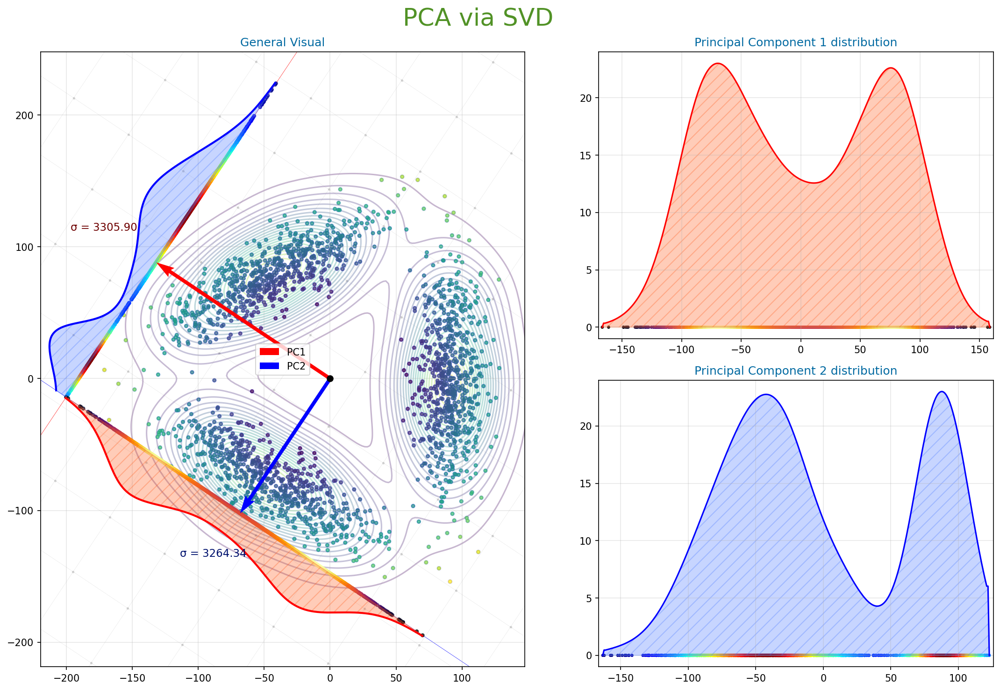

In [8]:
u.PCA_plot_2D_data(samples, 
                   figure_size=(15,10), contours=30, main_plot_projections_height=35)

---
Example: 2  
$
X = \mathcal{N}(\mu, \,\Sigma) + \text{Exp}(\lambda)
$

---



In [15]:
mean = np.array([0,0])
cov = np.array([[20, 2], 
                [2, 10]])
sizes = 1700
lambda_exp = np.random.randint(low=0, high=15)

# random data
data = np.random.multivariate_normal(mean, cov, size=sizes) \
       + np.random.exponential(lambda_exp, size=(sizes,2))

lambda = 7


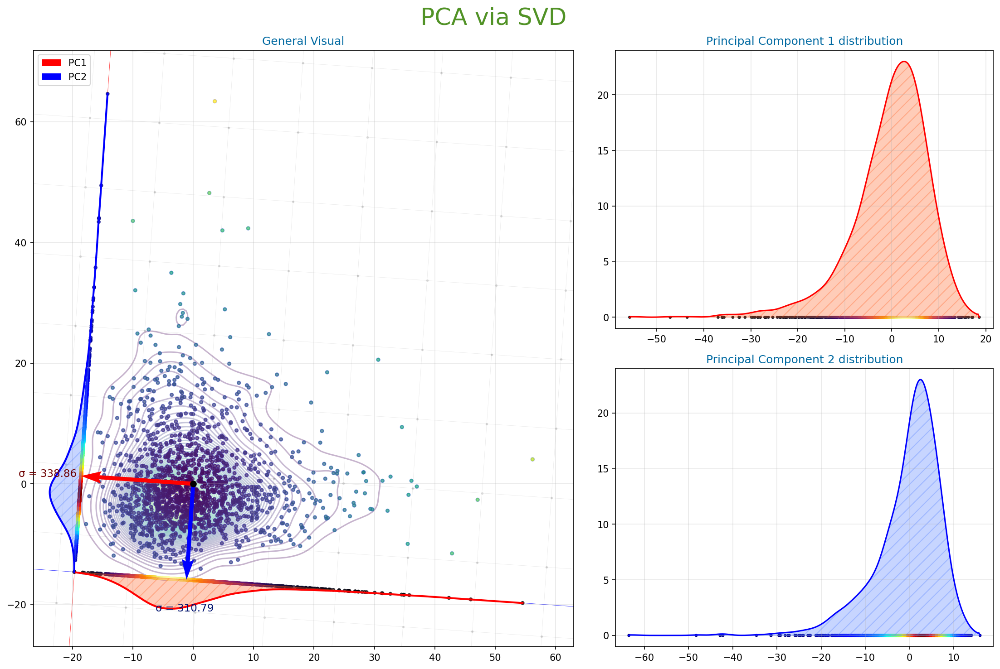

In [16]:
print(f"lambda = {lambda_exp}")
u.PCA_plot_2D_data(data, contours=50, main_plot_projections_height=5)

<div class="alert alert-success">
    <h3>PCA with Real Data:</h3>
    I compute and visualize the PCA for various k values, visual is only possible for k=1,2,3
</div>

---
Example: 1 <br>
Wine Dataset

---



In [3]:
# Loading wine dataset and transforming it into np.array

data_wine = pd.read_csv('wine.csv')
np_wine = data_wine.to_numpy()[:,1:]
print(f"Shape of dataset: {np_wine.shape}")

wine_labels = data_wine.iloc[:, 0].values
wine_features = data_wine.iloc[:, 1:].values

print(f"Features shape: {wine_features.shape}") 
print(f"Labels shape: {wine_labels.shape}")

data_wine

Shape of dataset: (178, 13)
Features shape: (178, 13)
Labels shape: (178,)


,Wine,Alcohol,Malic.acid,Ash,Acl,Mg,Phenols,Flavanoids,Nonflavanoid.phenols,Proanth,Color.int,Hue,OD,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


Principal Components Used: 1


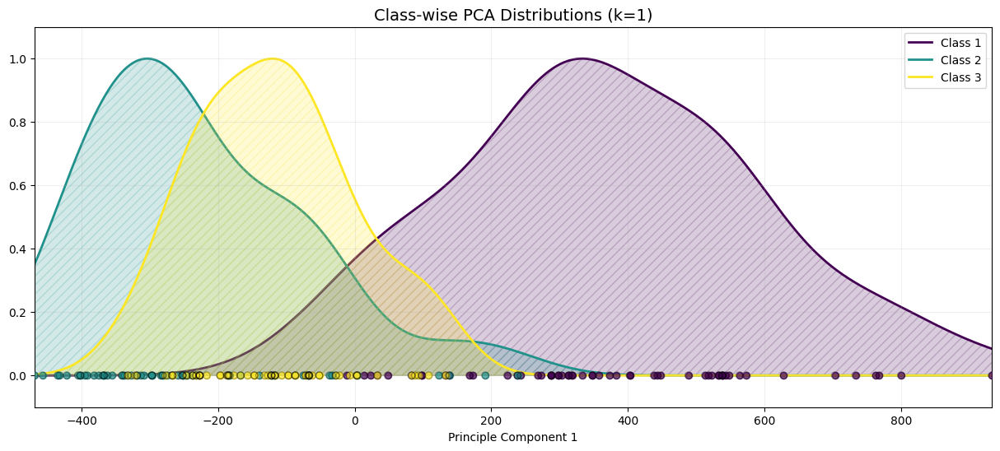

In [6]:
u.PCA_nd(data=np_wine, k=1, labels=wine_labels);

Principal Components Used: 1


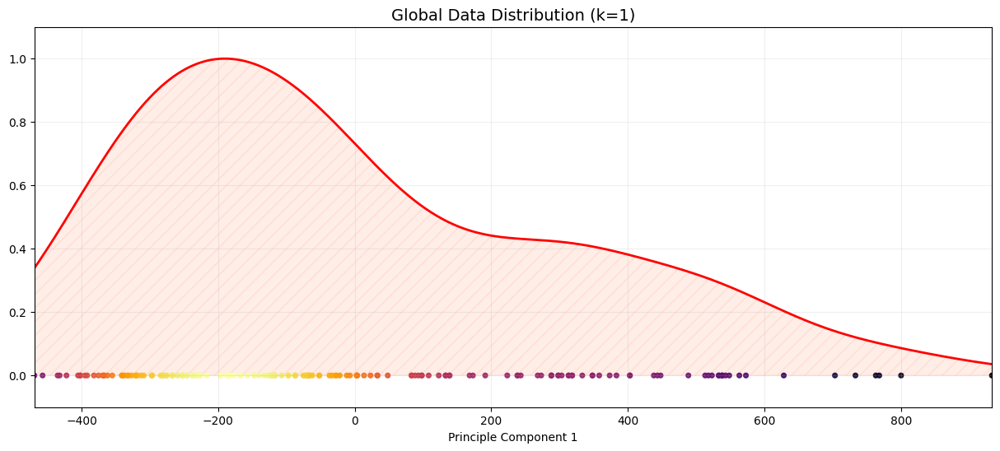

In [7]:
u.PCA_nd(data=np_wine, k=1);

Principal Components Used: 2


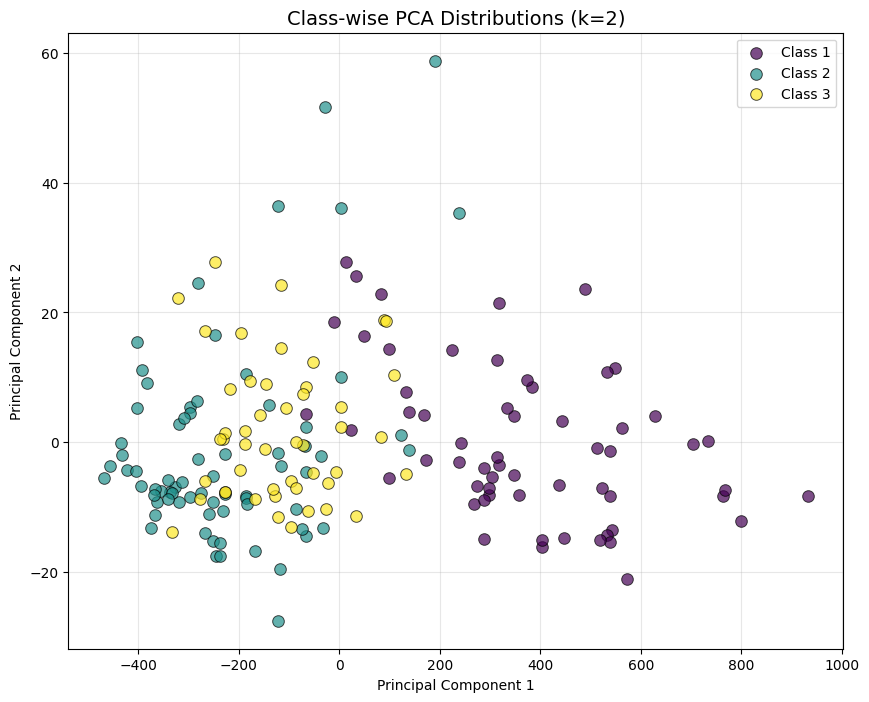

In [4]:
u.PCA_nd(data=np_wine, k=2, labels=wine_labels);

Principal Components Used: 2


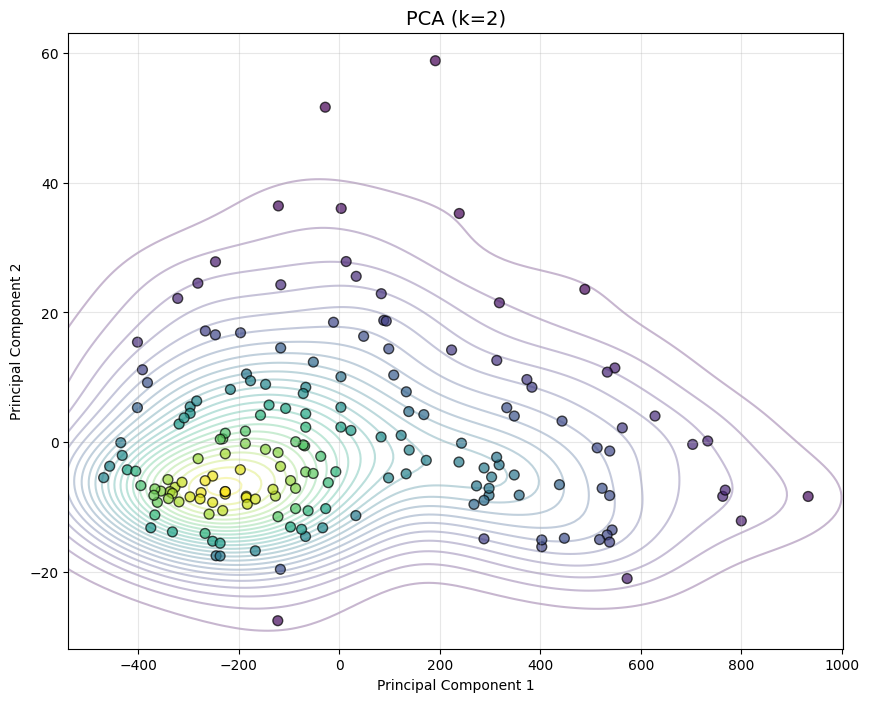

In [5]:
u.PCA_nd(data=np_wine, k=2);

In [8]:
u.PCA_nd(data=np_wine, k=3, labels=wine_labels);

Principal Components Used: 3


In [9]:
u.PCA_nd(data=np_wine, k=3);

Principal Components Used: 3


In [13]:
pca_wine = u.PCA_nd(data=np_wine, k=7);
print(pca_wine.shape)

Principal Components Used: 7
[[ 3.18562979e+02  2.14921307e+01 -3.13073470e+00 ... -6.77078222e-01
   5.68081040e-01 -6.19641832e-01]
 [ 3.03097420e+02 -5.36471768e+00 -6.82283550e+00 ...  4.86095978e-01
   1.43398712e-02  1.08865121e-01]
 [ 4.38061133e+02 -6.53730945e+00  1.11322298e+00 ... -3.80651426e-01
   6.72403748e-01  7.85818858e-01]
 ...
 [ 8.84580737e+01  1.87762846e+01  2.23757651e+00 ...  1.05733568e+00
   2.15000027e-01  6.48488641e-01]
 [ 9.34562419e+01  1.86708191e+01  1.78839152e+00 ...  2.76956208e-01
  -1.00922935e+00  4.14948247e-01]
 [-1.86943190e+02 -2.13330803e-01  5.63050984e+00 ... -7.03463092e-03
   7.03635720e-01 -6.93760896e-01]]
(178, 7)
